# Stacking 6 years of imagery into a GIF

We'll load all the [Landsat-8 (Collection 2, Level 2)](https://planetarycomputer.microsoft.com/dataset/landsat-8-c2-l2) data that's available from [Microsoft's Planetary Computer](https://planetarycomputer.microsoft.com/) over a small region on the coast of [Cape Cod](https://www.google.com/maps/place/Chatham,+MA/@41.7498076,-70.2026227,10.73z/data=!4m13!1m7!3m6!1s0x89fb15440149e94d:0x1f9c0efa001cb20b!2sCape+Cod!3b1!8m2!3d41.6687897!4d-70.2962408!3m4!1s0x89fb142168afbe53:0x714436ec7d485a53!8m2!3d41.6821432!4d-69.9597359), Massachusetts, USA.


Using nothing but standard xarray syntax, we'll mask cloudy pixels with the Landsat QA band and reduce the data down to biannual median composites.

Animated as a GIF, we can watch the coastline move over the years due to [longshore drift](https://en.wikipedia.org/wiki/Longshore_drift).

Planetary Computer is Microsoft's open Earth data initiative. It's particularly nice to use, since they also maintain a [STAC API](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/) for searching all the data, as well as a browseable [data catalog](https://planetarycomputer.microsoft.com/catalog). It's free for anyone to use, though you have to [sign your requests](https://planetarycomputer.microsoft.com/docs/concepts/sas/) with the `planetary_computer` package to prevent abuse. If you [sign up](https://planetarycomputer.microsoft.com/account/request), you'll get faster reads.

In [1]:
import coiled
import distributed
import dask
import pystac_client
import planetary_computer as pc
import ipyleaflet
import IPython.display as dsp
import stackstac

Using a cluster will make this _much_ faster. Particularly if you're not in Europe, which is where this data is stored.

You can sign up for a Coiled account and run clusters for free at https://cloud.coiled.io/ — no credit card or username required, just sign in with your GitHub or Google account.

In [2]:
cluster = coiled.Cluster(
    name="stackstac",
    software="stackstac-dev",
    backend_options={"region": "eu-central-1"},
    # ^ Coiled doesn't yet support Azure's West Europe region, so instead we'll run on a nearby AWS data center in Frankfurt
    n_workers=20,
)
client = distributed.Client(cluster)
client

Output()

Using existing cluster: 'stackstac'

/Users/gabe/Library/Caches/pypoetry/virtualenvs/stackstac-FdRcOknL-py3.8/lib/python3.8/site-packages/distributed/client.py:1140: VersionMismatchWarning: Mismatched versions found

+---------+---------------+---------------+---------------+
| Package | client        | scheduler     | workers       |
+---------+---------------+---------------+---------------+
| python  | 3.8.7.final.0 | 3.9.4.final.0 | 3.9.4.final.0 |
+---------+---------------+---------------+---------------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


Client Scheduler: tls://ec2-18-197-164-188.eu-central-1.compute.amazonaws.com:8786 Dashboard: http://ec2-18-197-164-188.eu-central-1.compute.amazonaws.com:8787,Cluster Workers: 13 Cores: 52 Memory: 208.00 GiB


Interactively pick the area of interest from a map. Just move the map around and re-run all cells to generate the timeseries somewhere else!

In [3]:
m = ipyleaflet.Map(scroll_wheel_zoom=True)
m.center = 41.64933994767867, -69.94438630063088
m.zoom = 12
m.layout.height = "800px"
m

Map(center=[41.64933994767867, -69.94438630063088], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [4]:
bbox = (m.west, m.south, m.east, m.north)

## Search for STAC items

Use [pystac-client](https://github.com/stac-utils/pystac-client) to connect to Microsoft's STAC API endpoint and search for Landsat-8 scenes.

In [5]:
catalog = pystac_client.Client.open('https://planetarycomputer.microsoft.com/api/stac/v1')

search = catalog.search(
    collections=['landsat-8-c2-l2'],
    bbox=bbox,
)
search.matched()

358

In [6]:
%%time
items = search.items_as_collection()

CPU times: user 648 ms, sys: 35.2 ms, total: 683 ms
Wall time: 18.8 s


Sign all the STAC items with a token from Planetary Computer. Without this, loading the data will fail.

In [7]:
items = pystac_client.ItemCollection([pc.sign_assets(item) for item in items.features])

These are the footprints of all the items we'll use:

In [8]:
dsp.GeoJSON(items.to_dict())

<IPython.display.GeoJSON object>

## Create an xarray with stacksatc

Set `bounds_latlon=bbox` to automatically clip to our area of interest (instead of using the full footprints of the scenes).

In [9]:
%%time
stack = stackstac.stack(items, bounds_latlon=bbox)
stack

CPU times: user 288 ms, sys: 13.5 ms, total: 301 ms
Wall time: 309 ms


,Array,Chunk
Bytes,59.11 GiB,6.07 MiB
Shape,"(358, 19, 777, 1501)","(1, 1, 777, 1024)"
Count,27210 Tasks,13604 Chunks
Type,float64,numpy.ndarray


And that's it for stackstac! Everything from here on is just standard xarray operations.

In [10]:
# use common_name for bands
stack = stack.assign_coords(band=stack.common_name.fillna(stack.band).rename("band"))
stack.band

<xarray.DataArray 'band' (band: 19)>
array(['QA_PIXEL', 'QA_RADSAT', 'coastal', 'blue', 'green', 'red', 'nir08',
       'swir16', 'swir22', 'SR_B8', 'lwir11', 'ST_ATRAN', 'ST_CDIST',
       'ST_DRAD', 'ST_URAD', 'ST_TRAD', 'ST_EMIS', 'ST_EMSD', 'ST_QA'],
      dtype=object)
Coordinates: (12/15)
  * band                       (band) object 'QA_PIXEL' 'QA_RADSAT' ... 'ST_QA'
    view:off_nadir             int64 0
    landsat:wrs_row            <U3 '031'
    description                (band) <U91 'Collection 2 Level-1 Pixel Qualit...
    proj:epsg                  int64 32619
    landsat:processing_level   <U4 'L2SP'
    ...                         ...
    instruments                object {'oli', 'tirs'}
    gsd                        (band) object None None None ... 30.0 30.0 30.0
    title                      (band) <U46 'Pixel Quality Assessment Band' .....
    common_name                (band) object None None 'coastal' ... None None
    center_wavelength          (band) object None None 0.44 ... None None None
    full_width_half_max        (band) object None None 0.02 ... None None None

See how much input data there is for just RGB. This is the amount of data we'll end up processing

In [11]:
stack.sel(band=["red", "green", "blue"])

,Array,Chunk
Bytes,9.33 GiB,6.07 MiB
Shape,"(358, 3, 777, 1501)","(1, 1, 777, 1024)"
Count,29358 Tasks,2148 Chunks
Type,float64,numpy.ndarray


## Mask cloudy pixels using the QA band

Use the bit values of the Landsat-8 QA band to mask out bad pixels. We'll mask pixels labeled as dilated cloud, cirrus, cloud, or cloud shadow. (By "mask", we mean just replacing those pixels with NaNs).

See page 14 on [this PDF](https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/atoms/files/LSDS-1328_Landsat8-9-OLI-TIRS-C2-L2-DFCB-v6.pdf) for the data table describing which bit means what.

In [12]:
# Make a bitmask---when we bitwise-and it with the data, it leaves just the 4 bits we care about
mask_bitfields = [1, 2, 3, 4]  # dilated cloud, cirrus, cloud, cloud shadow
bitmask = 0
for field in mask_bitfields:
    bitmask |= 1 << field

bin(bitmask)

'0b11110'

In [13]:
qa = stack.sel(band="QA_PIXEL").astype("uint16")
bad = qa & bitmask  # just look at those 4 bits

good = stack.where(bad == 0)  # mask pixels where any one of those bits are set

(array([  6., 172., 169.,   7.,   0.,   0.,   2.,   0.,   0.,   1.]),
 array([ 0. ,  3.9,  7.8, 11.7, 15.6, 19.5, 23.4, 27.3, 31.2, 35.1, 39. ]),
 <BarContainer object of 10 artists>)

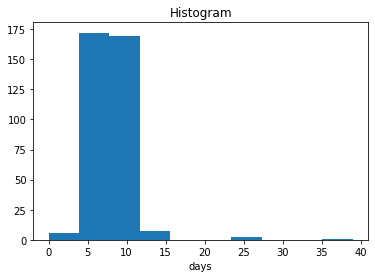

In [14]:
# What's the typical interval between scenes?
good.time.diff("time").dt.days.plot.hist()

## Make biannual median composites

The Landsat-8 scenes appear to typically be 5-10 days apart. Let's composite that down to a 6-month interval.

Since the cloudy pixels we masked with NaNs will be ignored in the `median`, this should give us a decent cloud-free-ish image for each.

In [15]:
# Make biannual median composites (`2Q` means 2 quarters)
composites = good.resample(time="2Q").median("time")
composites

,Array,Chunk
Bytes,2.81 GiB,3.04 MiB
Shape,"(17, 19, 777, 1501)","(1, 1, 777, 512)"
Count,73962 Tasks,969 Chunks
Type,float64,numpy.ndarray


Pick the red-green-blue bands to make a true-color image.

In [16]:
rgb = composites.sel(band=["red", "green", "blue"])
rgb

<xarray.DataArray 'stackstac-d3b3894766943d2fd4a754ae2b330217' (time: 17, band: 3, y: 777, x: 1501)>
dask.array<getitem, shape=(17, 3, 777, 1501), dtype=float64, chunksize=(1, 1, 777, 512), chunktype=numpy.ndarray>
Coordinates:
  * time                       (time) datetime64[ns] 2013-03-31 ... 2021-03-31
  * band                       (band) object 'red' 'green' 'blue'
  * x                          (x) float64 3.988e+05 3.989e+05 ... 4.438e+05
  * y                          (y) float64 4.623e+06 4.623e+06 ... 4.6e+06
    view:off_nadir             int64 0
    landsat:wrs_row            <U3 '031'
    proj:epsg                  int64 32619
    landsat:processing_level   <U4 'L2SP'
    platform                   <U9 'landsat-8'
    landsat:wrs_type           <U1 '2'
    landsat:collection_number  <U2 '02'
    instruments                object {'oli', 'tirs'}

Some final cleanup to make a nicer-looking animation:

* Drop the 2021 dates, since we're not far enough into 2021 yet to have enough scenes for a nice-looking composite.
* Forward-fill any NaN pixels from the previous frame, to make the animation look less jumpy.
* Also skip the first frame, since its NaNs can't be filled from anywhere.

In [25]:
cleaned = rgb.loc[:"2021-01-01"][1:]#.ffill("time")[1:]

In [60]:
# %%time
# x = cleaned.compute()

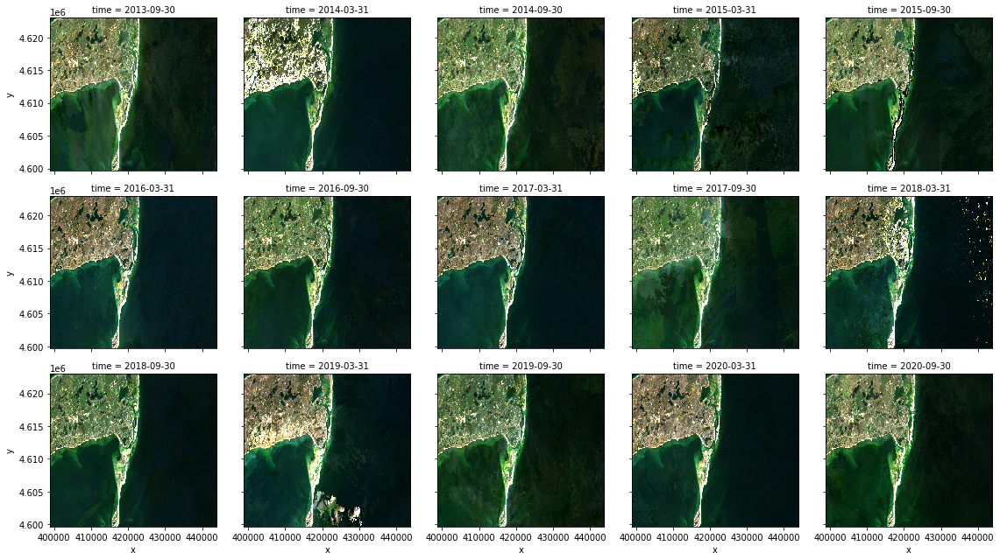

In [49]:
# x.bfill("time").bfill("time")[1:].plot.imshow(col="time", rgb="band", col_wrap=5, robust=True)

In [24]:
import dask
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import IPython.display as dsp


def gif(arr: xr.DataArray, fps=5, dpi=72, filename=None):
    if filename is None:
        filename = f"animation-{dask.base.tokenize(arr, fps, dpi)}.gif"

    # Modified from:
    # http://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/
    
    # Use xarray's `robust=True` rescaling
    rescaled = xr.plot.utils._rescale_imshow_rgb(arr, None, None, True)
    labels = rescaled[rescaled.dims[0]]

    # Bands need to be last for matplotlib
    frames = rescaled.transpose(..., "y", "x", "band").data
    assert frames.shape[-1] == 3, "Can only make GIFs of 3-band data currently"

    # First set up the figure, the axis, and the plot element we want to animate
    height, width = frames.shape[-3] / dpi, frames.shape[-2] / dpi
    fig = plt.figure(figsize=(width, height), frameon=False, tight_layout=True)

    a = frames[0]
    empty = a * 0
    im = plt.imshow(a, interpolation="none", aspect="equal", vmin=0, vmax=1)

    # initialization function: plot the background of each frame
    def init():
        im.set_data(empty)
        return [im]

    def animate_func(frame, *fargs):
        if frame % fps == 0:
            print(".", end="")

        im.set_data(frames[frame])
        plt.title(labels[frame].data)
        return [im]

    anim = animation.FuncAnimation(
        fig,
        animate_func,
        init_func=init,
        frames=len(frames),
        blit=True,
        interval=1000 / fps,  # in ms
    )

    anim.save(filename, fps=fps, writer="Pillow")
    plt.close()
    return dsp.Image(filename)


@dask.delayed(pure=False)
def delayed_gif(arr: xr.DataArray, fps=5, dpi=72, filename=None):
    if filename is None:
        filename = f"animation-{dask.base.tokenize(arr, fps, dpi)}.gif"

    gif(arr, fps=fps, dpi=dpi, filename=filename)

    with open(filename, "rb") as f:
        return f.read()

In [23]:
# import dask
# import numpy as np
# import xarray as xr
# import matplotlib.pyplot as plt
# import matplotlib.animation as animation
# import IPython.display as dsp


# def gif(arr: xr.DataArray, fps=5, dpi=72, filename=None):
#     if filename is None:
#         filename = f"animation-{dask.base.tokenize(arr, fps, dpi)}.gif"

#     # http://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/
#     rescaled = xr.plot.utils._rescale_imshow_rgb(arr.ffill("time")[1:], None, None, True)

#     snapshots = np.moveaxis(rescaled.data, -3, -1)

#     # First set up the figure, the axis, and the plot element we want to animate
#     height, width = arr.shape[-2] / dpi, arr.shape[-1] / dpi
#     fig = plt.figure(figsize=(width, height), frameon=False, tight_layout=True)

#     a = snapshots[0]
#     empty = a * 0
#     im = plt.imshow(a, interpolation="none", aspect="equal", vmin=0, vmax=1)

#     # initialization function: plot the background of each frame
#     # FWIW this doesn't seem to do anything
#     def init():
#         im.set_data(empty)
#         plt.title("")
#         return [im]

#     def animate_func(frame, *fargs):
#         if frame % fps == 0:
#             print(".", end="")

#         im.set_data(snapshots[frame])
#         plt.title(rescaled.time[frame].data)
#         return [im]

#     anim = animation.FuncAnimation(
#         fig,
#         animate_func,
#         init_func=init,
#         frames=len(snapshots),
#         blit=True,
#         interval=1000 / fps,  # in ms
#     )

#     anim.save(filename, fps=fps, writer="Pillow")
#     plt.close()
#     return dsp.Image(filename)


# @dask.delayed(pure=True)
# def delayed_gif(arr: xr.DataArray, fps=5, dpi=72, filename=None):
#     if filename is None:
#         filename = f"animation-{dask.base.tokenize(arr, fps, dpi)}.gif"

#     gif(arr, fps=fps, dpi=dpi, filename=filename)

#     with open(filename, "rb") as f:
#         return f.read()


In [28]:
client.upload_file("gif.py")

{'tls://10.12.11.114:42449': {'status': 'OK'},
 'tls://10.12.11.12:36069': {'status': 'OK'},
 'tls://10.12.11.17:43139': {'status': 'OK'},
 'tls://10.12.11.40:44645': {'status': 'OK'},
 'tls://10.12.11.58:44871': {'status': 'OK'},
 'tls://10.12.11.87:45713': {'status': 'OK'},
 'tls://10.12.12.181:39723': {'status': 'OK'},
 'tls://10.12.12.204:35817': {'status': 'OK'},
 'tls://10.12.12.244:39421': {'status': 'OK'},
 'tls://10.12.12.254:35691': {'status': 'OK'},
 'tls://10.12.12.30:39873': {'status': 'OK'},
 'tls://10.12.12.48:44343': {'status': 'OK'},
 'tls://10.12.12.79:40181': {'status': 'OK'},
 'tls://10.12.13.107:44083': {'status': 'OK'},
 'tls://10.12.13.108:40891': {'status': 'OK'},
 'tls://10.12.13.130:41571': {'status': 'OK'},
 'tls://10.12.13.145:37315': {'status': 'OK'},
 'tls://10.12.13.183:41891': {'status': 'OK'},
 'tls://10.12.13.228:46121': {'status': 'OK'},
 'tls://10.12.13.34:33801': {'status': 'OK'}}

In [29]:
from gif import delayed_gif

In [38]:
%%time
data = delayed_gif(cleaned).compute()

KeyboardInterrupt: 

In [ ]:
# we turned ~7GiB of data into a 5MB GIF!
dask.utils.format_bytes(len(data))

In [ ]:
import IPython.display as dsp

In [ ]:
dsp.Image(data=data)